In [1]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
# sys.path.append("./Grab_TNGgalaxy")
import illustris_python as il
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'
from astroML.plotting import setup_text_plots
#Lets text in plots use latex
# setup_text_plots(usetex=True)

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning: LinearRegressionwithErrors requires PyMC3 to be installed
  warnings.warn('LinearRegressionwithErrors requires PyMC3 to be installed')


In [2]:
'''Tranfer SnapNum to Redshift'''

import numpy as np
import h5py, scipy
from pynbody import units as units_conv

Redshift_snapshot = np.loadtxt('/home/bianyuan/workspace/data/Redshift_snapshot.txt',comments='Snapshot')

def redshift_snapshot(snapshots, datafile='/home/bianyuan/workspace/data/Redshift_snapshot.txt', return_opt=None):
    snapshots0, redshifts0 = np.loadtxt(datafile, skiprows=1, unpack=True, usecols=[0, 2])
    n_snap = np.size(snapshots)
    if n_snap == 1: 
        redshifts = redshifts0[np.where(snapshots0 == snapshots)][0]
    elif n_snap >1:
        redshifts = np.zeros(n_snap)
        for ii in range(n_snap): 
            if  snapshots[ii] is np.nan: 
                redshifts[ii] = np.nan
            else:
                redshifts[ii] = redshifts0[np.where(snapshots0 == snapshots[ii])][0]
    if return_opt is None: 
        return redshifts
#   elif return_opt == 'age':
#       return age(redshifts)
    elif return_opt == 'FT':
        return FT(redshifts)

def _a_dot(a, h0, om_m, om_l):                                
    om_k = 1.0 - om_m - om_l      
    return h0 * a * np.sqrt(om_m * (a ** -3) + om_k * (a ** -2) + om_l)  

def _a_dot_recip(*args):
    return 1. / _a_dot(*args) 

# The formation time of stars in unit of Gyr
def FT(redshift, h0=0.6774, OmegaM=0.3089, OmegaL=0.6911):
    conv = units_conv.Unit("0.01 s Mpc km^-1").ratio('Gyr')
    redshift = 1./(1. + redshift)
    ns = np.size(redshift)
    if ns > 1:
        FT = np.zeros(ns)
        for ii in range(ns): FT[ii] = scipy.integrate.quad(_a_dot_recip, 0, redshift[ii], (h0, OmegaM, OmegaL))[0] * conv
    else:
        FT = scipy.integrate.quad(_a_dot_recip, 0, redshift, (h0, OmegaM, OmegaL))[0] * conv
    return FT

In [3]:
import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from tqdm import tqdm

from scipy.interpolate import UnivariateSpline
from scipy.signal import argrelextrema

def remove_spikes(data, window_size=5):
    if window_size % 2 == 0:
        raise ValueError("window_size must be an odd number")

    n = len(data)
    half_window = window_size // 2
    filtered_data = np.copy(data)  # 创建数据的副本

    for i in range(half_window, n - half_window):
        # 使用当前点及其邻近点的中位数替换当前点的值
        filtered_data[i] = np.median(data[i - half_window:i + half_window + 1])

    return filtered_data

def remove_initial_spikes(data, threshold=10):
    # 找到第一个不大于阈值的值的索引
    valid_start_index = next((i for i, value in enumerate(data) if value <= threshold), None)
    
    # 如果找不到符合条件的值，意味着所有值都不需要被移除
    if valid_start_index is None:
        return data
    
    # 返回从找到的索引开始到结束的数据
    return data[valid_start_index:], valid_start_index

def find_periapsis_indices(distances, velocity, Rvir):
    # 找到distances中第一个小于Rvir的索引
    valid_start_index = next((i for i, value in enumerate(distances) if value < Rvir), None)
    
    if valid_start_index is None:
        return []  # 如果没有找到符合条件的索引，则返回空列表
    
    # 查找距离的局部最小点（仅在valid_start_index之后）
    local_min_indices = [i for i in range(valid_start_index + 1, len(distances) - 1) 
                         if distances[i] < distances[i - 1] and distances[i] < distances[i + 1]]
    
    local_max_indices = [i for i in range(valid_start_index + 1, len(distances) - 1) 
                         if distances[i] > distances[i - 1] and distances[i] > distances[i + 1]]
    
    # 查找速度的局部最大点
    local_max_velocity_indices = [i for i in range(1, len(velocity) - 1) 
                                  if velocity[i] > velocity[i - 1] and velocity[i] > velocity[i + 1]]
    
    # 初始化近心点索引列表
    periapsis_indices = []
    
    for min_index in local_min_indices:
        # 查找与当前距离局部最小点最近的速度局部最大点
        if local_max_velocity_indices:  # 确保有局部最大速度点存在
            nearest_max_velocity_index = min(local_max_velocity_indices, key=lambda x: abs(x - min_index))
            
            # 选择两者之间的索引作为近心点索引
            if nearest_max_velocity_index > min_index:
                # 如果最近的速度局部最大点在距离局部最小点之后，选择两者之间的索引
                periapsis_index = min_index + (nearest_max_velocity_index - min_index) // 2
            else:
                # 如果最近的速度局部最大点在距离局部最小点之前，也选择两者之间的索引
                periapsis_index = nearest_max_velocity_index + (min_index - nearest_max_velocity_index) // 2
            
            periapsis_indices.append(periapsis_index)
        else:
            # 如果没有找到任何局部最大速度点，则直接使用距离局部最小点作为近心点
            periapsis_indices.append(min_index)
    
    return periapsis_indices

def adjust_first_periapsis_index(periapsis_indices, SFR):
    # 找到SFR最大值的索引
    max_SFR_index = np.argmax(SFR)
    
    # 如果近心点索引列表为空，直接返回SFR最大值的索引
    if not periapsis_indices:
        return [max_SFR_index]
    
    # 计算第一个近心点索引与SFR最大值索引之间的差距
    distance_to_max_SFR = abs(periapsis_indices - max_SFR_index)
    
    # 设置一个阈值来决定是否需要调整第一个近心点的索引
    # 这里的阈值可以根据具体情况进行调整
    threshold = len(SFR) * 0.05  # 例如，总数据长度的5%
    
    # 如果第一个近心点与SFR最大值的索引相差大于阈值，则用SFR最大值的索引替换
    if distance_to_max_SFR > threshold:
        periapsis_indices = max_SFR_index
    
    return periapsis_indices

def find_first_pericenter_index(times, distances, velocity):
    # Step 1: 数据拟合
    dist_spline = UnivariateSpline(times, distances, s=1)
    vel_spline = UnivariateSpline(times, velocity, s=1)
    
    # 微分求导找局部极值点
    dist_spline_der = dist_spline.derivative()
    vel_spline_der = vel_spline.derivative()

    # Step 2: 找到距离的局部最小值点和速度的局部最大值点
    local_min_indices = argrelextrema(dist_spline_der(times), np.less)[0]
    local_max_velocity_indices = argrelextrema(vel_spline_der(times), np.greater)[0]

    # Step 3: 确定第一个近心点
    # 初始化
    first_pericenter_index = None
    for min_idx in local_min_indices:
        # 检查是否有局部最大速度与当前局部最小距离相匹配
        if any(abs(min_idx - max_idx) <= len(times) * 0.05 for max_idx in local_max_velocity_indices):
            first_pericenter_index = min_idx
            break

    if first_pericenter_index is None:
        return None
    
    # Step 4: 在原始数据中找到最接近的点的索引
    # 计算拟合曲线的近心点对应的真实时间点
    pericenter_time = times[first_pericenter_index]
    # 找到与该时间点最接近的原始数据索引
    real_index = np.argmin(np.abs(times - pericenter_time))

    return real_index

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)

x_start = 2
dex = 0.55

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
filter_condition_BSF = np.array(CSSs3['Form_Type']) == 'Bursty Star Formation'

filtered_ids_BSF = np.array(CSSs3['ID'])[filter_condition_BSF]
filtered_ids_TS = np.array(CSSs3['ID'])[filter_condition_TS]

file_paths = {
    'MRI_path': '/home/bianyuan/workspace/data/combine_connect_snap/MRI_mergertree_evo_properties_2.hdf5',
    'MRO_path': '/home/bianyuan/workspace/data/combine_connect_snap/MRO_mergertree_evo_properties_2.hdf5'
}

results_BSF = {}
results_TS = {}

ZH_BSF_begin = []
ZH_TS_begin = []

# 对于每个HDF5文件
for model_name, file_path in file_paths.items():
    with h5py.File(file_path, 'r') as hdf_file:
        # 对于每个筛选出的星系ID
        for group_name in tqdm(filtered_ids_BSF, desc=f"Processing {model_name}"):
            group_name_str = str(group_name)
            if group_name_str in hdf_file:
                group = hdf_file[group_name_str]
                numbers = np.array(group['Number'])
                snaps = np.array(group['Snap'])  # Assuming Snap data is always available

                x = np.array(group['x'])
                y = np.array(group['y'])
                z = np.array(group['z'])
                vx = np.array(group['vx'])
                vy = np.array(group['vy'])
                vz = np.array(group['vz'])
                velocity = np.sqrt(vx**2+vy**2+vz**2)
                Rvir = np.array(group['Rvir'])
                dist = np.sqrt(x**2+y**2+z**2)
                dist_normalized = dist/Rvir

                indices = (numbers > 150) & (dist_normalized > 0)

                times = np.array(FT(redshift_snapshot(np.array(group['Snap']))))

                times = times[indices][::-1]

                dist_normalized = dist_normalized[indices][::-1]

                velocity = velocity[indices][::-1]

                pericenter_index = find_periapsis_indices(dist_normalized, velocity, Rvir[-1])

                if pericenter_index:
                    first_pericenter_index = pericenter_index[0]

                    snaps_filtered = snaps[indices]

                    star_masses = np.array(group['Effective_star_mass'])[indices][::-1]
                    star_masses = remove_spikes(star_masses,7)
                    star_masses, valid_start_index = remove_initial_spikes(star_masses, 1e10)
                    
                    ZHs = np.array(group['ZH'])[indices][::-1]
                    ZHs = ZHs[valid_start_index:]
                    ZH_BSF_begin.append(ZHs[0])
                    results_BSF[int(group_name_str)] = {'Effective_star_mass': star_masses, 'ZHs': ZHs}
# 对于每个HDF5文件
for model_name, file_path in file_paths.items():
    with h5py.File(file_path, 'r') as hdf_file:
        # 对于每个筛选出的星系ID
        for group_name in tqdm(filtered_ids_TS, desc=f"Processing {model_name}"):
            group_name_str = str(group_name)
            if group_name_str in hdf_file:
                group = hdf_file[group_name_str]
                numbers = np.array(group['Number'])
                snaps = np.array(group['Snap'])  # Assuming Snap data is always available

                x = np.array(group['x'])
                y = np.array(group['y'])
                z = np.array(group['z'])
                vx = np.array(group['vx'])
                vy = np.array(group['vy'])
                vz = np.array(group['vz'])
                velocity = np.sqrt(vx**2+vy**2+vz**2)
                Rvir = np.array(group['Rvir'])
                dist = np.sqrt(x**2+y**2+z**2)
                dist_normalized = dist/Rvir

                indices = (numbers > 150) & (dist_normalized > 0)

                times = np.array(FT(redshift_snapshot(np.array(group['Snap']))))

                times = times[indices][::-1]

                dist_normalized = dist_normalized[indices][::-1]

                velocity = velocity[indices][::-1]

                pericenter_index = find_periapsis_indices(dist_normalized, velocity, Rvir[-1])

                if pericenter_index:
                    first_pericenter_index = pericenter_index[0]

                    snaps_filtered = snaps[indices]

                    star_masses = np.array(group['Effective_star_mass'])[indices][::-1]
                    star_masses = remove_spikes(star_masses,7)
                    star_masses, valid_start_index = remove_initial_spikes(star_masses, 1e10)
                    
                    ZHs = np.array(group['ZH'])[indices][::-1]
                    ZHs = ZHs[valid_start_index:]
                    ZH_TS_begin.append(ZHs[0])
                    results_TS[int(group_name_str)] = {'Effective_star_mass': star_masses, 'ZHs': ZHs}

Processing MRI_path:  31%|███       | 53/173 [00:00<00:01, 86.57it/s]

Processing MRO_path: 100%|██████████| 54/54 [00:01<00:00, 44.63it/s]


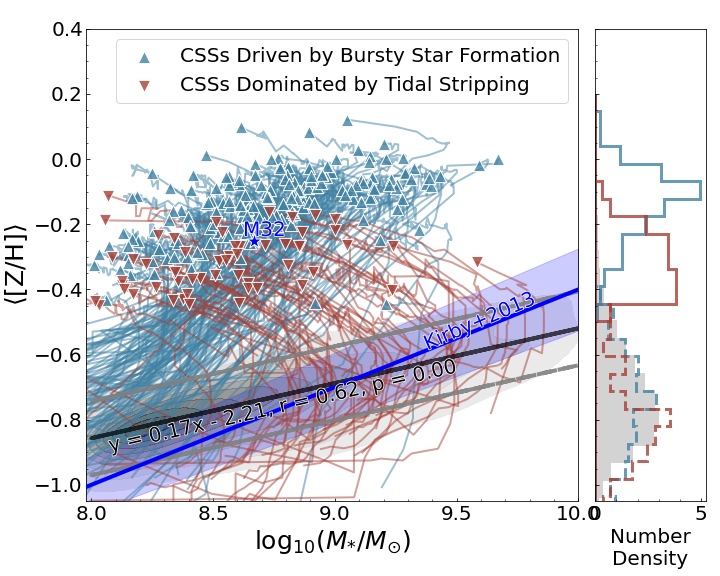

In [4]:
import seaborn as sns
from scipy.stats import linregress
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from matplotlib import patheffects as path_effects
from scipy.signal import savgol_filter
import pandas as pd

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

filter_condition_TS = (np.array(CSSs3['Form_Type']) == 'Tidal Stripping')
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')

dex = 0.55

Star_BSF = np.array(CSSs3['Star mass'])[filter_condition_BSF]
Star_TS = np.array(CSSs3['Star mass'])[filter_condition_TS]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])

Z_BSF = np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF] - dex
Z_TS = np.array(CSSs3['[Z/H]_r'])[filter_condition_TS] - dex
Z_iso_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
# Group_iso_ND = np.array(Normal_Dwarf['Groupmass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Z_iso_ND =np.array(Normal_Dwarf['[Z/H]']) - dex

fig = plt.figure(figsize=(10, 8))
plt.subplots_adjust(left=0.12, bottom=0.13, right=0.98, top=0.95, wspace=0.15, hspace=0.07)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内
grid = plt.GridSpec(5, 5, hspace=0, wspace=0.15)
# ax_right = fig.add_subplot(grid[0, 0:6], xticklabels=[], yticklabels=[])
ax_right = fig.add_subplot(grid[0:5, -1], yticklabels=[])

ax_right.set_xlabel('Number\nDensity', fontsize=20)
ax_right.tick_params(axis='both', which='both', labelsize=20)

ax_main = fig.add_subplot(grid[0:5,0:4])

ax_right.hist(Z_iso_ND, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey', density=True)

ax_right.hist(np.array(ZH_BSF_begin)[np.where(np.array(ZH_BSF_begin) < -0.4+dex)]-dex, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none', density=True, linestyle='--')


ax_right.hist(np.array(ZH_TS_begin)-dex, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none', density=True, linestyle='--')

ax_right.hist(Z_BSF, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none', density=True)


ax_right.hist(Z_TS, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none', density=True)

ax_right.set_ylim(-0.5-dex,0.95-dex)  # 设置水平方向的坐标轴范围
ax_right.minorticks_on()

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)

for galaxy_id, strengths in results_BSF.items():
    plt.plot(np.log10(strengths['Effective_star_mass']), strengths['ZHs']-dex, color=grp, alpha=0.5, linewidth=2)

for galaxy_id, strengths in results_TS.items():
    plt.plot(np.log10(strengths['Effective_star_mass']), strengths['ZHs']-dex, color=cl, alpha=0.5, linewidth=2)

# for galaxy_id, strengths in results_BSF.items():
#     effective_star_mass = np.log10(strengths['Effective_star_mass'])
#     ZHs = strengths['ZHs'] - dex
#     smoothed_ZHs = savgol_filter(ZHs, window_length=17, polyorder=1)  # 调整 window_length 和 polyorder 参数以获得合适的平滑效果
#     plt.plot(effective_star_mass, smoothed_ZHs, color=grp, alpha=0.5, linewidth=1)

# # 对 Tidal Stripping 数据进行平滑处理
# for galaxy_id, strengths in results_TS.items():
#     effective_star_mass = np.log10(strengths['Effective_star_mass'])
#     ZHs = strengths['ZHs'] - dex
#     smoothed_ZHs = savgol_filter(ZHs, window_length=17, polyorder=1)  # 调整 window_length 和 polyorder 参数以获得合适的平滑效果
#     plt.plot(effective_star_mass, smoothed_ZHs, color=cl, alpha=0.5, linewidth=1)

ax_main.scatter(np.log10(Star_BSF), Z_BSF, s=150, label='CSSs Driven by Bursty Star Formation', marker='^', edgecolor='white', color=grp, zorder=400)
ax_main.scatter(np.log10(Star_TS), Z_TS, s=150, label='CSSs Dominated by Tidal Stripping', marker='v', edgecolor='white', color=cl, zorder=401)

ax_main.scatter(8.67,-0.25, s=250, marker='*', edgecolor='white', color='blue', zorder=401)

text = ax_main.annotate('M32', xy=(8.67, -0.25), xytext=(10, 10), textcoords='offset points', 
                 fontsize=20, color='blue', ha="center", va="center", zorder=401)

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

AIMSSIII_y = [0.2, 0.1, 0.2, 0.38, 0.25, 0.27, 0.05, 0.2, 0.1, -0.1, -0.07, 0.25, 0.27, -0.05, -0.28, -0.25, 0.38, 0.05]

# ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, label='Janz+2016', marker='X', edgecolor='white', color='black', zorder=400)

x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 执行线性回归
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Calculate the angle of the regression line
angle = np.arctan(0.23) * (180 / np.pi)

# 计算预测值
predicted_values = slope * x + intercept

# 计算残差
residuals = Z_iso_ND - predicted_values

# 计算1σ偏差
deviation = np.std(residuals)

# 绘制散点图和拟合直线
ax_main.plot(x, predicted_values, linestyle='-', linewidth=4, color='black',alpha=0.7, zorder=400)

# 绘制误差直线
ax_main.plot(x, predicted_values-deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9, zorder=400)
ax_main.plot(x, predicted_values+deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9, zorder=400)

ax_main.minorticks_on()

ax_main.legend(fontsize=20)

# Display the equation of the regression line rotated along the line
equation = f"y = {slope:.2f}x - {np.abs(intercept):.2f}, r = {r_value:.2f}, p = {p_value:.2f}"
text = ax_main.annotate(equation, xy=(0.4,0.20), xycoords='axes fraction', fontsize=20, rotation=angle, ha="center", va="center", zorder=500)

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# Given linear relationship parameters and errors
slope = 0.30
intercept = -1.69
slope_error = 0.02
intercept_error = 0.04

# Choose a range of stellar masses (in log scale)
log_mass_range = np.linspace(8-0.2, 10, 400)  # considering from 10^6 to 10^11 solar masses

# Calculate y values (metallicity) using the slope and intercept
z_h_values = slope * (log_mass_range + 0.3 - 6) + intercept

# Calculate y values for upper and lower error bounds
z_h_upper = (slope + slope_error) * (log_mass_range + 0.3 - 6) + (intercept + intercept_error)
z_h_lower = (slope - slope_error) * (log_mass_range + 0.3 - 6) + (intercept - intercept_error)


ax_main.plot(log_mass_range, z_h_values, 'b-', linewidth=4, zorder=400)

angle = np.arctan(0.43) * (180 / np.pi)

text = ax_main.annotate('Kirby+2013', xy=(0.8,0.38), xycoords='axes fraction', color='blue', fontsize=20, rotation=angle, ha="center", va="center", zorder=400)

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])
ax_main.fill_between(log_mass_range, z_h_lower, z_h_upper, color='blue', alpha=0.2)  # Fill in the error range

ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(-0.5-dex,0.95-dex) 

ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}/M_{\odot})$',fontsize=25)
ax_main.set_ylabel(r'$\langle \mathrm{[Z/H]} \rangle$', fontsize=25)

# # 添加colorbar
# cax = fig.add_axes([0.55, 0.25, 0.22, 0.02])  # 调整colorbar的位置和大小
# cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
# cbar.set_label('Number Density\nof Dwarfs', fontsize=20)
# cbar.ax.tick_params(labelsize=13)
# cbar.outline.set_edgecolor('none')  # 设置 colorbar 外框线颜色为 'none'
# cbar.outline.set_linewidth(0)  # 设置 colorbar 外框线宽度为 0
# # cbar.set_ticks([])
# cbar.ax.xaxis.set_label_coords(0.5, -2.2)  # Increase the y-coordinate value (-1.2 in this example)

plt.savefig('/home/bianyuan/workspace/pic/m-ZH_1'+'.pdf')

In [ ]:
print(results_BSF.items())

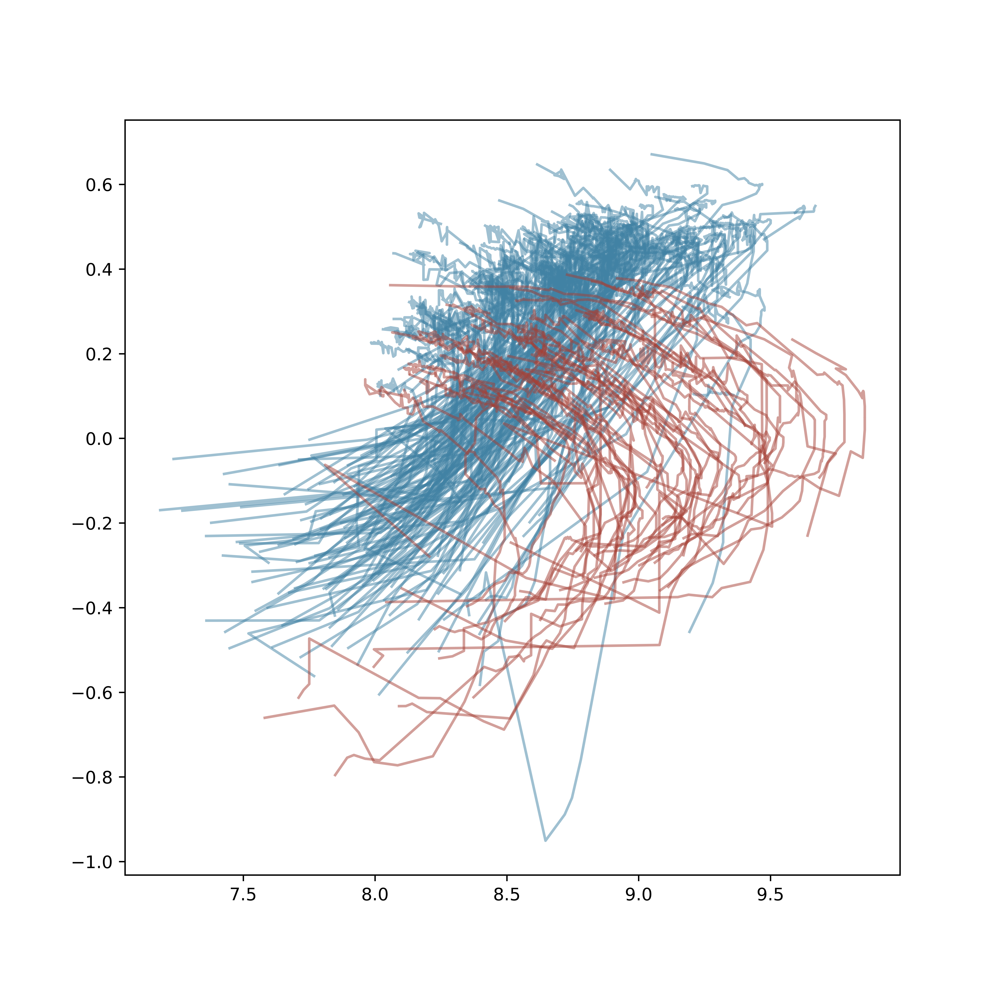

In [29]:
plt.figure(figsize=(8,8),dpi=800)

for galaxy_id, strengths in results_BSF.items():
    plt.plot(np.log10(strengths['Effective_star_mass']), strengths['ZHs'], color=grp, alpha=0.5)

for galaxy_id, strengths in results_TS.items():
    plt.plot(np.log10(strengths['Effective_star_mass']), strengths['ZHs'], color=cl, alpha=0.5)

plt.savefig('/home/bianyuan/workspace/pic/MZR_evo.pdf')